### Step 1 : Import Required Libraries

In [ ]:
!pip install folium

In [ ]:
import pandas as pd
import numpy as np
import folium

### Step 2 : Load the Dataset

In [ ]:
df = pd.read_csv('/content/Dataset .csv')

In [ ]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

### Step 3 : Data Preprocessing

1. Feature selection

In [ ]:
df_geo = df [[
    "Restaurant ID",
    "Restaurant Name",
    "City",
    "Locality",
    "Locality Verbose",
    "Latitude",
    "Longitude",
    "Cuisines",
    "Aggregate rating",
    "Price range",
    "Average Cost for two"
]]

In [ ]:
df_geo

,Restaurant ID,Restaurant Name,City,Locality,Locality Verbose,Latitude,Longitude,Cuisines,Aggregate rating,Price range,Average Cost for two
0,6317637,Le Petit Souffle,Makati City,"Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",14.565443,121.027535,"French, Japanese, Desserts",4.8,3,1100
1,6304287,Izakaya Kikufuji,Makati City,"Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",14.553708,121.014101,Japanese,4.5,3,1200
2,6300002,Heat - Edsa Shangri-La,Mandaluyong City,"Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",14.581404,121.056831,"Seafood, Asian, Filipino, Indian",4.4,4,4000
3,6318506,Ooma,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",14.585318,121.056475,"Japanese, Sushi",4.9,4,1500
4,6314302,Sambo Kojin,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",14.584450,121.057508,"Japanese, Korean",4.8,4,1500
...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,��stanbul,Karak�_y,"Karak�_y, ��stanbul",41.022793,28.977392,Turkish,4.1,3,80
9547,5908749,Ceviz A��ac۱,��stanbul,Ko��uyolu,"Ko��uyolu, ��stanbul",41.009847,29.041297,"World Cuisine, Patisserie, Cafe",4.2,3,105
9548,5915807,Huqqa,��stanbul,Kuru�_e��me,"Kuru�_e��me, ��stanbul",41.055817,29.034640,"Italian, World Cuisine",3.7,4,170
9549,5916112,A���k Kahve,��stanbul,Kuru�_e��me,"Kuru�_e��me, ��stanbul",41.057979,29.036019,Restaurant Cafe,4.0,4,120


In [ ]:
df_geo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   City                  9551 non-null   object 
 3   Locality              9551 non-null   object 
 4   Locality Verbose      9551 non-null   object 
 5   Latitude              9551 non-null   float64
 6   Longitude             9551 non-null   float64
 7   Cuisines              9542 non-null   object 
 8   Aggregate rating      9551 non-null   float64
 9   Price range           9551 non-null   int64  
 10  Average Cost for two  9551 non-null   int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 820.9+ KB


2. Handling Missing values

In [ ]:
df_geo.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
City,0
Locality,0
Locality Verbose,0
Latitude,0
Longitude,0
Cuisines,9
Aggregate rating,0
Price range,0


In [ ]:
df_geo["Cuisines"] = df_geo["Cuisines"].fillna("Unknown")

In [ ]:
df_geo.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
City,0
Locality,0
Locality Verbose,0
Latitude,0
Longitude,0
Cuisines,0
Aggregate rating,0
Price range,0


### Step 4 : Interactive Geographical Mapping

In [ ]:
map_center = [df_geo["Latitude"].mean(), df_geo["Longitude"].mean()]

In [ ]:
restaurant_map = folium.Map(location=map_center, zoom_start=11)

In [ ]:
for _, row in df_geo.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=2,
        color="blue",
        fill=True,
        fill_opacity=0.7,
        popup=row["Restaurant Name"]  # optional tooltip
    ).add_to(restaurant_map)

In [ ]:
restaurant_map

### Step 5 : Group by City & Analyze Concentration

1. Group by City & Analyze Concentration

In [ ]:
city_counts = df_geo["City"].value_counts()

In [ ]:
city_counts

,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25
...,...
Lakes Entrance,1
Mohali,1
Panchkula,1


2. Visualize the Top N Cities

<Axes: title={'center': 'Top 10 Cities by Restaurant Count'}, xlabel='City'>

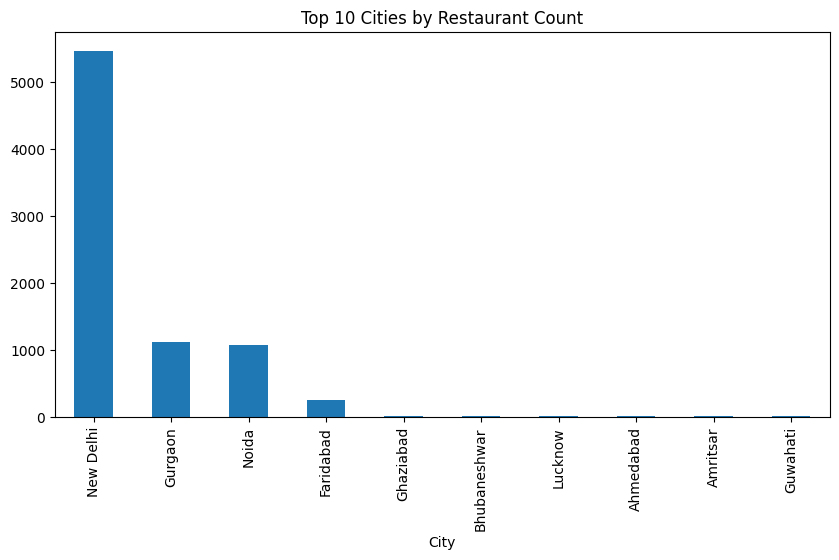

In [ ]:
city_counts.head(10).plot(kind="bar", figsize=(10,5), title="Top 10 Cities by Restaurant Count")

This chart shows the top 10 cities with the highest number of restaurants in the dataset. Higher counts indicate areas with strong restaurant presence and potentially higher competition or consumer demand.

In [ ]:
#Compute percentage share of restaurants per city

city_percentage = (city_counts / city_counts.sum()) * 100
city_percentage.head(10)

,count
City,
New Delhi,57.302900
Gurgaon,11.705581
Noida,11.307716
Faridabad,2.627997
Ghaziabad,0.261753
Bhubaneshwar,0.219872
Lucknow,0.219872
Ahmedabad,0.219872
Amritsar,0.219872


### Step 6 : Location-Specific Statistics

1. Average Rating per City

In [ ]:
avg_rating_by_city = df_geo.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False)

In [ ]:
avg_rating_by_city.head(10)

,Aggregate rating
City,
Inner City,4.900000
Quezon City,4.800000
Makati City,4.650000
Pasig City,4.633333
Mandaluyong City,4.625000
Beechworth,4.600000
London,4.535000
Taguig City,4.525000
Secunderabad,4.500000


<Axes: title={'center': 'Top 10 Cities by Average Restaurant Rating'}, xlabel='City'>

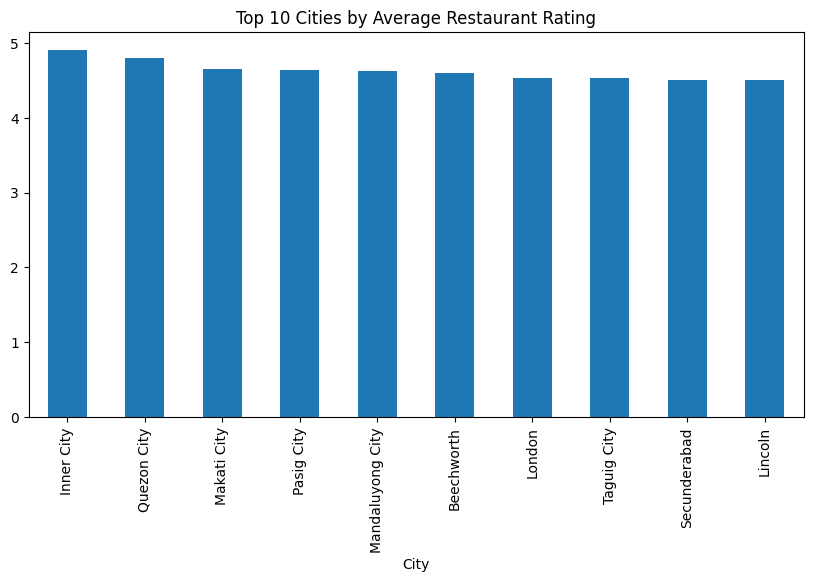

In [ ]:
#Plot
avg_rating_by_city.head(10).plot(kind="bar", figsize=(10,5), title="Top 10 Cities by Average Restaurant Rating")

Above plot answers the question “Which cities have better-rated restaurants?"

2. Average Cost / Price per City

In [ ]:
avg_cost_by_city = df_geo.groupby("City")["Average Cost for two"].mean().sort_values(ascending=False)

In [ ]:
avg_cost_by_city.head(10)

,Average Cost for two
City,
Jakarta,308437.500000
Tangerang,250000.000000
Bogor,160000.000000
Bandung,150000.000000
Pasay City,3333.333333
Colombo,2375.000000
Mandaluyong City,2000.000000
Panchkula,2000.000000
Taguig City,1725.000000


<Axes: title={'center': 'Top 10 Cities by Average Cost for Two'}, xlabel='City'>

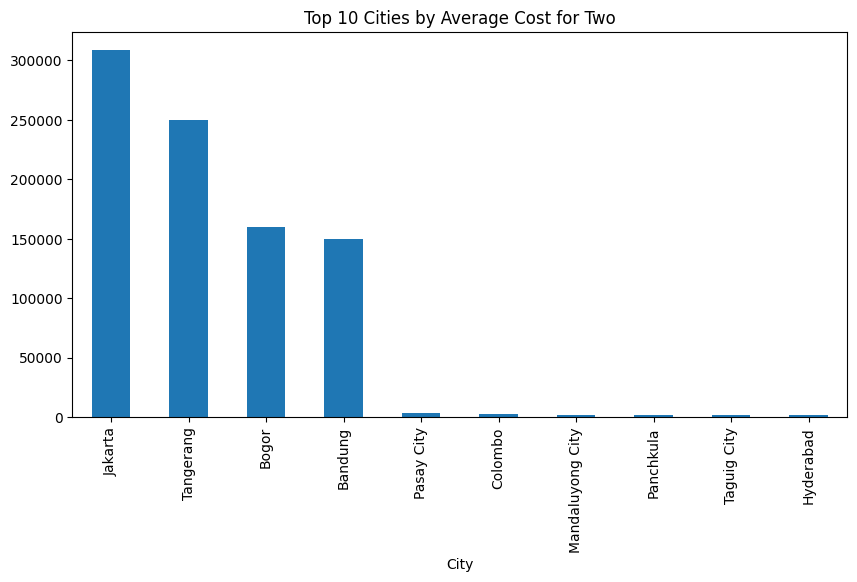

In [ ]:
#Plot
avg_cost_by_city.head(10).plot(kind="bar", figsize=(10,5), title="Top 10 Cities by Average Cost for Two")

Above plot answers the question “Which cities are the most expensive for dining?”

3. Top Cuisines per City

In [ ]:
cuisine_city = (
    df_geo.assign(Cuisine=df_geo["Cuisines"].str.split(",")).explode("Cuisine")
)

top_cuisines_by_city = (
    cuisine_city.groupby(["City", "Cuisine"]).size().reset_index(name="Count")
)


In [ ]:
top_cuisines_by_city

,City,Cuisine,Count
0,Abu Dhabi,Afghani,1
1,Abu Dhabi,Arabian,2
2,Abu Dhabi,Asian,1
3,Abu Dhabi,Biryani,1
4,Abu Dhabi,Burger,1
...,...,...,...
2402,��stanbul,Desserts,2
2403,��stanbul,Italian,1
2404,��stanbul,Restaurant Cafe,4
2405,��stanbul,Turkish,1


In [ ]:
top_5_cuisines_by_city = (
    top_cuisines_by_city.sort_values(["City", "Count"], ascending=[True, False]).groupby("City").head(5)
)

In [ ]:
top_5_cuisines_by_city.head(15)

,City,Cuisine,Count
24,Abu Dhabi,Indian,6
19,Abu Dhabi,American,4
14,Abu Dhabi,North Indian,3
1,Abu Dhabi,Arabian,2
5,Abu Dhabi,Chinese,2
45,Agra,North Indian,12
38,Agra,Mughlai,8
30,Agra,Chinese,5
31,Agra,Continental,5
39,Agra,North Indian,3


This chart explain the question “Which cuisines dominate each city?”